# Multiclass Bark Texture Images Classification
 
> ## Notebook Author : Anshul Bhardwaj

### Downloading the Libraries 👇

In [1]:
import warnings
warnings.filterwarnings("ignore") 

import time
start_time = time.time()

!pip3 install pandas tqdm sklearn opencv-contrib-python-headless imgaug seaborn scipy psutil humanize GPUtil -q --disable-pip-version-check
!pip3 install opencv-contrib-python==4.5.5.62 -q

print("Time taken to run this cell =  %s seconds" % (time.time() - start_time))

Time taken to run this cell =  20.955967664718628 seconds


### Importing the Libraries 👇

In [2]:
import pandas as pd
import numpy as np
import scipy
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

import random
from tqdm import tqdm
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.utils import class_weight
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization, AveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from imgaug import augmenters as iaa
from tensorflow.keras.preprocessing.image  import ImageDataGenerator

import os
os.environ['PYTHONHASHSEED'] = '42'
from numpy.random import seed
seed(42)
random.seed(42)
tf.random.set_seed(42)
import gc
import sys
import collections
import time

import psutil
import humanize
import GPUtil as GPU

from IPython.display import display
from PIL import Image
from PIL.ImageDraw import Draw

%matplotlib inline

import glob
import os

In [3]:
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

2022-09-17 10:20:14.809128: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-17 10:20:14.906499: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-17 10:20:14.907363: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


### Reading paths and classes of all Image files 👇

In [4]:
all_files = []
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        all_files.append(os.path.join(dirname, filename))
        
files_list = []
for i, file in enumerate(all_files):
    classname = file.split('/')[-2]
    files_list.append({'Path':file, 'class':classname})

# converting filenames to DataFrame
df = pd.DataFrame(files_list)
df.head()

,Path,class
0,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Wrightia
1,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Wrightia
2,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Wrightia
3,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Wrightia
4,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Wrightia


### Exploratory Data Analysis 👇

### Visualizing frequency of each Image class 👇

<AxesSubplot:>

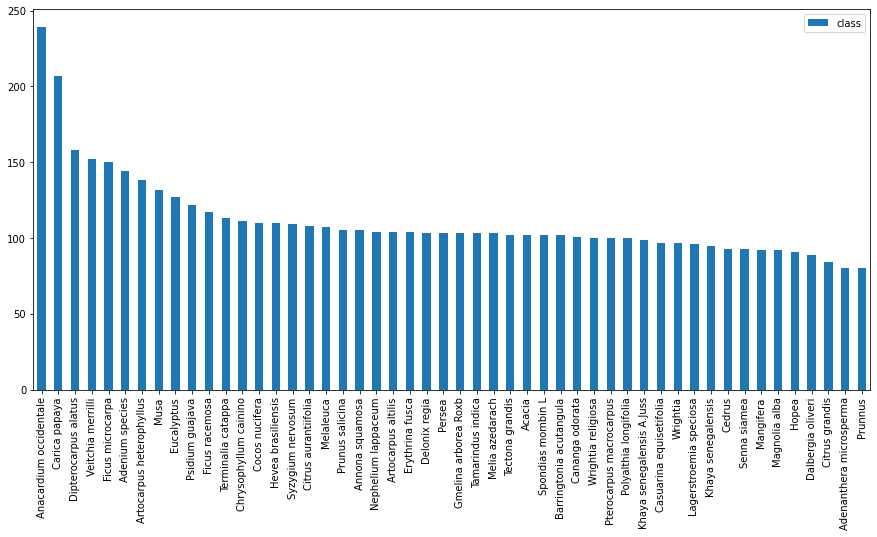

In [5]:
pd.DataFrame(df['class'].value_counts()).plot(kind='bar', figsize=(15,7))

## Observation * 👇

> - Dataset is not highly imbalanced.

### Labelling Image classes 👇

In [6]:
classes = df['class'].unique()

map_dict = {}
for i, category in enumerate(classes):
    map_dict[category] = i
    
reverse_map_dict = {v:k for k,v in map_dict.items()}

ClassIds = []
for i, category in enumerate(df['class']):
    ClassIds.append(map_dict[category])
    
df['ClassId'] = ClassIds

df = df.sample(frac=1).reset_index(drop=True)
df

,Path,class,ClassId
0,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Dalbergia oliveri,22
1,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Anacardium occidentale,13
2,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Melaleuca,7
3,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Syzygium nervosum,24
4,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Khaya senegalensis,4
...,...,...,...
5573,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Prunus salicina,32
5574,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Acacia,46
5575,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Acacia,46
5576,/kaggle/input/barkvn50/BarkVN-50/BarkVN-50_men...,Senna siamea,48


### Visualizing 5 images from each class 👇

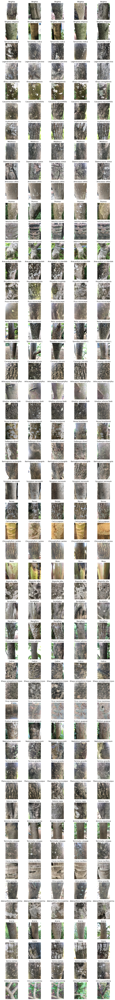

In [7]:
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

def showImagesHorizontally(list_of_files, title=['No Title'], fig_size=(15,40), rows=5):
    fig = figure(figsize=fig_size)
    number_of_files = len(list_of_files)
    for i in range(number_of_files):
        a = fig.add_subplot((number_of_files//rows)+1,rows,i+1)
        image = imread(list_of_files[i])
        imshow(image,cmap='Greys_r')
        a.set_title(reverse_map_dict[title[i]])
        axis('off')

PathList = []
ClassList = []
for x in range(len(df.ClassId.unique())):
    sample = df[df['ClassId']==x].sample(5)
    PathList = PathList + sample.Path.to_list()
    ClassList = ClassList + sample.ClassId.to_list()
    
showImagesHorizontally(PathList, title=ClassList, fig_size=(15,140))

### GPU Info

In [8]:
GPUs = GPU.getGPUs()

# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

printm()

Gen RAM Free: 14.8 GB  | Proc size: 923.5 MB
GPU RAM Free: 16278MB | Used: 2MB | Util   0% | Total 16280MB


### Loading Images into memory from storage 👇

In [9]:
X = []
Y = []

# Setting Image dimention. each image will be resize to this size. 
d = 128 

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

for i in tqdm(range(df.shape[0])):
    imagepath = df['Path'][i]
    img = cv2.imread(imagepath)
    image_from_array = Image.fromarray(img, 'RGB')
    # resizing the images
    size_image = image_from_array.resize((d, d))
    X.append(np.array(size_image))
    Y.append(df['ClassId'][i])
    
X = np.array(X)
Y = np.array(Y)

100%|██████████| 5578/5578 [00:46<00:00, 118.82it/s]


### Train-Test split 👇
- validation size = 0.2

In [10]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

print("Shape of X_train: ", len(X_train), "and Y_train:" , len(Y_train))
print("Shape of X_test: " , len(X_val),  "and Y_test:" ,len(Y_val))

Shape of X_train:  4462 and Y_train: 4462
Shape of X_test:  1116 and Y_test: 1116


## Image Augumentation 👇
- As we only have average of 100 images in each class, which may not be sufficient to get good accuracy.
- More images can be generated using image augmentation
- I am flipping all the images to generate more images.

In [11]:
start_time = time.time()

# Left Right Flip
seq1 = iaa.Sequential([
    iaa.Fliplr()
])

# Up Down Flip
seq2 = iaa.Sequential([
    iaa.Flipud()
])

# First Left Right and then Up Down Flip
seq3 = iaa.Sequential([
    iaa.Fliplr(),
    iaa.Flipud()
])

# concatenating flipped images to training dataset.
X_train = np.concatenate((X_train, seq1(images=X_train), seq2(images=X_train), seq3(images=X_train)))
Y_train = np.concatenate((Y_train, Y_train, Y_train, Y_train))

Y_train = to_categorical(Y_train, 50)
Y_val = to_categorical(Y_val, 50)

print("Shape of X_train: ", len(X_train), "and Y_train:" , len(Y_train))
print("Shape of X_test: " , len(X_val),  "and Y_test:" ,len(Y_val))

print("Time taken to run this cell =  %s seconds" % (time.time() - start_time))


Shape of X_train:  17848 and Y_train: 17848
Shape of X_test:  1116 and Y_test: 1116
Time taken to run this cell =  0.8688597679138184 seconds


### Using ResNet50V2 based Transfer Learning model for training 👇
 - I also tried custom training CNN model from scratch but accuracy was better with Transfer learning model. *

In [15]:
from tensorflow.keras.applications import ResNet50V2
base_model_ResNet50V2 = ResNet50V2(include_top = False, weights= 'imagenet', input_shape = (d, d, 3), classes = Y_train.shape[1])

#Adding the final layers to the above base models where the actual classification is done in the dense layers
model1= Sequential()
model1.add(base_model_ResNet50V2) 
#Adding the Dense layers along with activation and batch normalization
model1.add(Dense(1000, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(rate=0.5, seed=42))
model1.add(Flatten())
model1.add(Dense(500, activation='relu'))
model1.add(Dropout(rate=0.5, seed=42))
model1.add(Dense(50, activation='softmax'))

# compiling the model
model1.compile(
    loss='categorical_crossentropy', 
    optimizer= tf.keras.optimizers.Adam(learning_rate=0.0005), 
    metrics = ['accuracy']
)

# monitoring validation accuracy
monitoring1 = 'val_accuracy'
filepath="bestResNet50V2ModelWeights.hdf5"

# setting model checkpoint, earlystopping, reduce_lr
checkpoint = ModelCheckpoint(filepath, monitor=monitoring1, verbose=0, save_best_only=True, mode='max')
earlystop = EarlyStopping(monitor = monitoring1, min_delta = 0, patience = 4, verbose = 1,restore_best_weights = True)
reduce_lr = ReduceLROnPlateau(monitor=monitoring1, factor=0.2, verbose = 1, patience=2, min_lr=0.000001)
callbacks_list = [checkpoint, earlystop, reduce_lr]

# Setting meximum epochs
epochs = 200

# training the model
history1 = model1.fit(X_train, Y_train, batch_size=256, epochs=epochs, verbose=1, validation_data=(X_val, Y_val), 
                      shuffle=True, callbacks=callbacks_list, use_multiprocessing=True, workers=-1)

Epoch 1/200
70/70 [==============================] - 104s 396ms/step - loss: 1.8359 - accuracy: 0.5538 - val_loss: 9.9214 - val_accuracy: 0.2151
Epoch 2/200
70/70 [==============================] - 27s 382ms/step - loss: 0.3764 - accuracy: 0.8923 - val_loss: 1.6671 - val_accuracy: 0.7392
Epoch 3/200
70/70 [==============================] - 27s 381ms/step - loss: 0.1815 - accuracy: 0.9488 - val_loss: 0.6695 - val_accuracy: 0.8737
Epoch 4/200
70/70 [==============================] - 27s 380ms/step - loss: 0.1064 - accuracy: 0.9711 - val_loss: 1.1626 - val_accuracy: 0.8073
Epoch 5/200
70/70 [==============================] - 27s 381ms/step - loss: 0.0752 - accuracy: 0.9792 - val_loss: 0.7411 - val_accuracy: 0.8620

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 6/200
70/70 [==============================] - 27s 381ms/step - loss: 0.0284 - accuracy: 0.9915 - val_loss: 0.2553 - val_accuracy: 0.9409
Epoch 7/200
70/70 [==============================] - 

> ## *Model is giving validation accuracy of 95.61%*

### Accuracy and Loss plots 👇

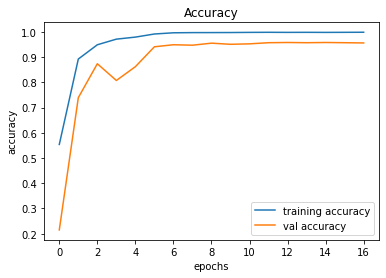

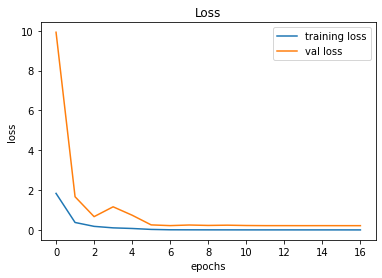

In [16]:
plt.figure(0)
plt.plot(history1.history['accuracy'], label='training accuracy')
plt.plot(history1.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

plt.figure(1)
plt.plot(history1.history['loss'], label='training loss')
plt.plot(history1.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

### Classification report for  ResNet50V2 Transfer Learning Model 👇

In [26]:
finalResNet50Model = keras.models.load_model('bestResNet50V2ModelWeights.hdf5')

Y_pred_ResNet50Model_prob = finalResNet50Model.predict(X_val, batch_size = 64, use_multiprocessing=True )
Y_pred_ResNet50Model = np.argmax(Y_pred_ResNet50Model_prob,axis=-1)
Y_val_ = np.argmax(Y_val,axis=-1)

In [27]:
print(classification_report(Y_val_, Y_pred_ResNet50Model))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        19
           1       0.95      1.00      0.98        21
           2       0.89      0.94      0.91        17
           3       0.96      0.92      0.94        26
           4       1.00      1.00      1.00        16
           5       0.95      0.90      0.92        20
           6       0.85      0.89      0.87        19
           7       0.78      0.95      0.86        22
           8       1.00      0.97      0.98        33
           9       1.00      1.00      1.00        24
          10       0.96      0.96      0.96        23
          11       1.00      1.00      1.00        47
          12       1.00      1.00      1.00        24
          13       0.98      1.00      0.99        45
          14       0.89      0.94      0.91        17
          15       0.97      1.00      0.98        32
          16       1.00      1.00      1.00        18
          17       1.00    